In [ ]:
#!unzip "/content/drive/MyDrive/Dog-Vision-Project/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog-Vision-Project"

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub


print("TF version:", tf.__version__)
print("Hub version:", hub.__version__)
print("GPU is", "available" if tf.config.list_physical_devices("GPU") else "NOT AVAILABLE")


TF version: 2.18.0
Hub version: 0.16.1
GPU is NOT AVAILABLE


In [ ]:
import pandas as pd
labels = pd.read_csv("/content/drive/MyDrive/Dog-Vision-Project/labels.csv")
labels.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels.value_counts()

,,count
id,breed,
fff43b07992508bc822f33d8ffd902ae,chesapeake_bay_retriever,1
000bec180eb18c7604dcecc8fe0dba07,boston_bull,1
001513dfcb2ffafc82cccf4d8bbaba97,dingo,1
001cdf01b096e06d78e9e5112d419397,pekinese,1
00214f311d5d2247d5dfe4fe24b2303d,bluetick,1
...,...,...
007b8a07882822475a4ce6581e70b1f8,redbone,1
007ff9a78eba2aebb558afea3a51c469,lakeland_terrier,1
008887054b18ba3c7601792b6a453cc3,boxer,1


<Axes: xlabel='breed'>

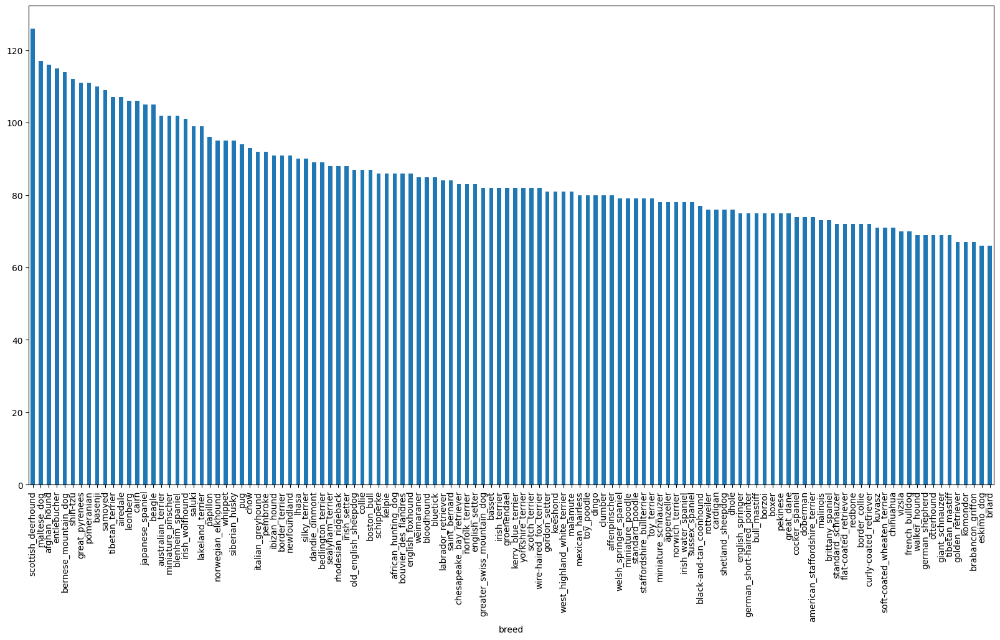

In [ ]:
labels["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
filenames = ["drive/MyDrive/Dog-Vision-Project/train/" + fname + ".jpg" for fname in labels["id"]]

In [ ]:
import os
if len(os.listdir("drive/MyDrive/Dog-Vision-Project/train/")) == len(filenames):
  print("Match")
else:
  print("No Match")

Match


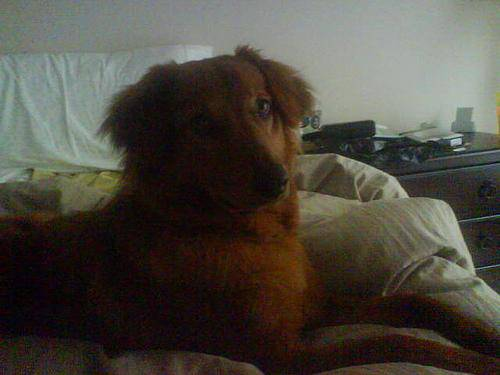

In [ ]:
from IPython.display import Image
Image(filenames[1000])

In [ ]:
labels['breed'][1000]

'irish_setter'

### Lets Prepare labels

In [ ]:
import numpy as np

breed = labels["breed"]
breed = np.array(breed)
len(breed)

10222

In [ ]:
#See if something is missing
if len(breed) == len(filenames):
  print("Match")
else:
  print("No Match")

Match


In [ ]:
#Find the unique values
unique_breeds = np.unique(breed)
len(unique_breeds)

120

In [ ]:
#Turn Single Label into an array of bools

breed[0] == unique_breeds


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into bools array
boolean_labels = [labels == np.array(unique_breeds) for labels in breed]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Turning Boolena arrays into integers
print(breed[0])
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[1].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

### Create Validation set

In [ ]:
X = filenames
y = boolean_labels

We are gooing to start with 1000 images

In [ ]:
#Set no. of images
NUM_IMAGES = 1000 #@param{type:"slider",min:1000,max:10222}
#Split data into train and validano



from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2, random_state=42)


In [ ]:
len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

## Preprocessing Images
Converting Images to tensors
we are going to make a function
1. Take image path as input
2. Use Tensorflow to read the file and save it to a variable,'**image**'
3. turn our 'image' into a tensors
4. resize the image to be of shape (224,224)
5. Return Modified Image



In [ ]:
from matplotlib.pyplot import imread
image = imread(filenames[4])
image.shape

(500, 500, 3)

array([[[ 85,  87,  84],
        [ 85,  87,  84],
        [ 85,  87,  84],
        ...,
        [ 78,  84,  80],
        [ 78,  84,  80],
        [ 78,  84,  80]],

       [[ 83,  85,  82],
        [ 83,  85,  82],
        [ 83,  85,  82],
        ...,
        [ 78,  84,  80],
        [ 78,  84,  80],
        [ 78,  84,  80]],

       [[ 80,  82,  79],
        [ 80,  82,  79],
        [ 80,  82,  79],
        ...,
        [ 78,  84,  80],
        [ 78,  84,  80],
        [ 78,  84,  80]],

       ...,

       [[ 93,  95,  92],
        [ 88,  90,  87],
        [ 87,  89,  86],
        ...,
        [ 88,  89,  84],
        [ 88,  89,  84],
        [ 85,  86,  81]],

       [[100, 102,  99],
        [ 93,  95,  92],
        [ 89,  91,  88],
        ...,
        [ 90,  91,  86],
        [ 90,  91,  86],
        [ 87,  88,  83]],

       [[ 94,  96,  93],
        [ 87,  89,  86],
        [ 82,  84,  81],
        ...,
        [ 90,  91,  86],
        [ 89,  90,  85],
        [ 87,  88,  83]]], dtype=uint8)
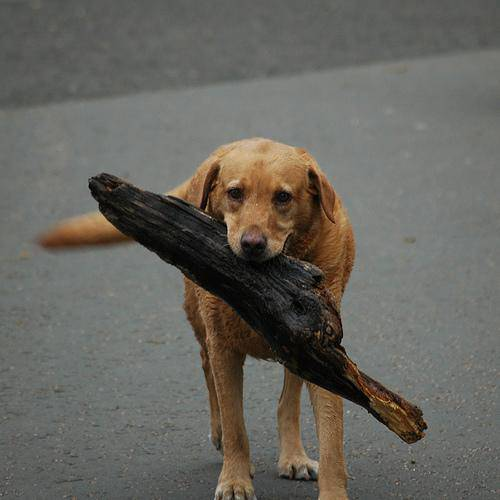

In [ ]:
image

In [ ]:
image.max()

np.uint8(225)

In [ ]:
image.min()

np.uint8(0)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 500, 3), dtype=uint8, numpy=
array([[[85, 87, 84],
        [85, 87, 84],
        [85, 87, 84],
        ...,
        [78, 84, 80],
        [78, 84, 80],
        [78, 84, 80]],

       [[83, 85, 82],
        [83, 85, 82],
        [83, 85, 82],
        ...,
        [78, 84, 80],
        [78, 84, 80],
        [78, 84, 80]]], dtype=uint8)>

Now we have seen that how the image looks like in tensor now lets preprocess it

1. Take image path as input
2. Use Tensorflow to read the file and save it to a variable,'**image**'
3. turn our 'image' into a tensors
4. Normalise image convert the color channel values from 0-255 to 0-1 values
5. resize the image to be of shape (224,224)
6. Return Modified Image


In [ ]:
#Define Image size
IMG_SIZE = 224

#Create Functiom
def process_image(image_path , img_size = IMG_SIZE):
  """
  takes an image filepath as input and returns the image into tensor
  """
  #Read an image file
  image = tf.io.read_file(image_path)
  # turn the jpg image into numerical tensors
  image = tf.image.decode_jpeg(image, channels=3)
  #convert the color channel values from 0-255 to 0-1 values
  image  = tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

### Turning data into batches
in order to use TensorFlow effectively , we need our data in the form of Tensor Touples which look like this
"(image , label)"

In [ ]:
#Create a function to return a touple
def get_image_label(image_path , label):
  """
  Takes Image filepath name and associated label and returns the label
  """
  image = process_image(image_path)
  return image, label

In [ ]:
get_image_label(X_train[42], tf.constant(y_train[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.2744866 , 0.20389837, 0.11079565],
         [0.27839956, 0.19976756, 0.10625179],
         [0.30656803, 0.22681487, 0.13666254],
         ...,
         [0.12188374, 0.12972689, 0.17678571],
         [0.11385673, 0.13132882, 0.1738708 ],
         [0.10720414, 0.13465512, 0.1738708 ]],
 
        [[0.31015828, 0.2395263 , 0.1564482 ],
         [0.29944888, 0.2288911 , 0.1439755 ],
         [0.35615736, 0.28561288, 0.20727609],
         ...,
         [0.12188374, 0.12972689, 0.17678571],
         [0.12156864, 0.13725491, 0.18039216],
         [0.12156864, 0.13725491, 0.18039216]],
 
        [[0.31448126, 0.24534611, 0.18136677],
         [0.32765028, 0.26288837, 0.19786212],
         [0.28300735, 0.21902803, 0.15713201],
         ...,
         [0.12188374, 0.12972689, 0.17678571],
         [0.11619399, 0.13188025, 0.1750175 ],
         [0.11619399, 0.13188025, 0.1750175 ]],
 
        ...,
 
        [[0.84118253, 0.7941237 

Now lets make function to divide our data into batches


In [ ]:
#Define batch size of 32 which is default in tensorflow
BATCH_SIZE = 32
#function
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input

  """
  #If the data is the test data
  if test_data:
    print("Creating Batches for Test Data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  #If data is valid data we dont need to shuffel it
  elif valid_data:
    print("Creating Batches for Validation Data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(np.array(y)))) # Convert y to NumPy array
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  #For Training Data
  else:
    print("Creating Batches for Training Data")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(np.array(y)))) # Convert y to NumPy array
    data = data.shuffle(buffer_size=(len(X)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch




In [ ]:
trian_data = create_data_batches(X_train,y_train)
valid_data = create_data_batches(X_val,y_val,valid_data=True)

Creating Batches for Training Data
Creating Batches for Validation Data


### Visualising Batches

In [ ]:
import matplotlib.pyplot as plt
# Create function to view images in data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch, and the true labels.
  """
  plt.figure(figsize=(10, 10))
  for i in range(25):
    #Create Subplot of 5 rows and 5 Columns
    ax = plt.subplot(5,5,i+1)
    #display
    plt.imshow(images[i])
    #Add image label
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")



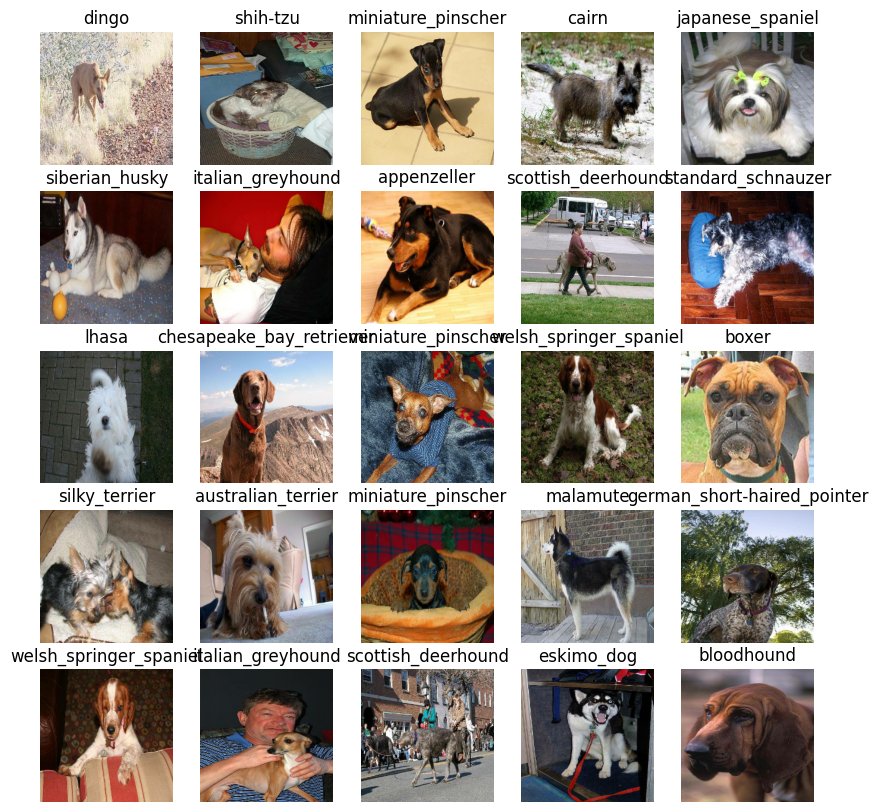

In [ ]:
train_images, train_labels = next(trian_data.as_numpy_iterator())
show_25_images(train_images , train_labels)


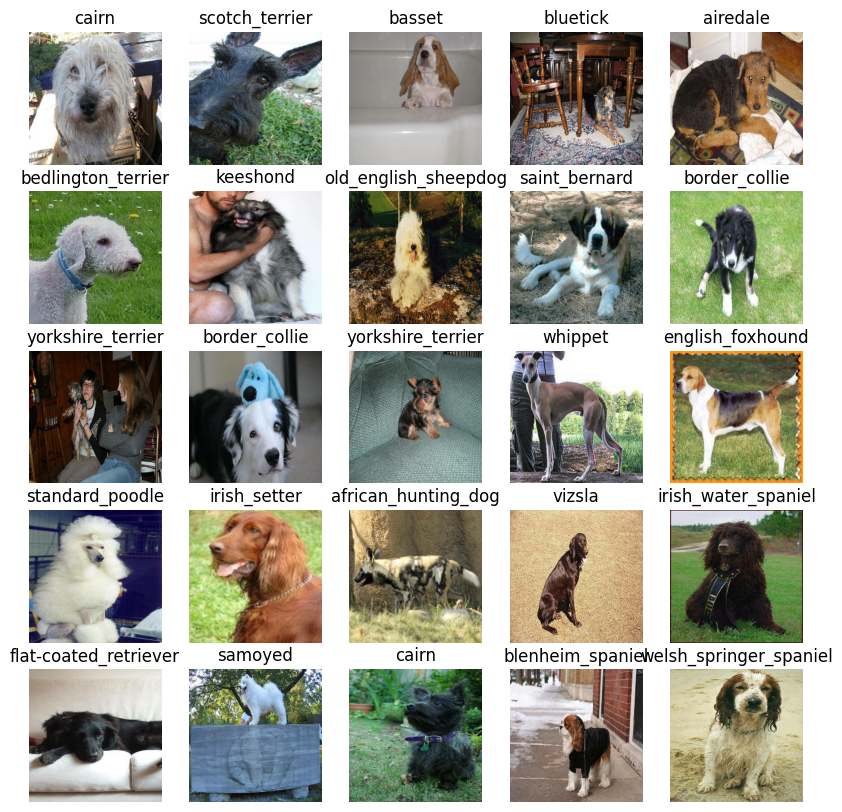

In [ ]:
val_images , val_labels = next(valid_data.as_numpy_iterator())
show_25_images(val_images , val_labels)

## Building Model

1. The input shape in form of tensors
2. The output shape in form of tensors
3. The url of model we want to use


In [ ]:
#Define the input shape the the model
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]
#Define the output shape of the model
OUTPUT_SHAPE=len(unique_breeds)# Number of Unique labels
#setup model URL from TensorFLow Hub
MODEL_URL="https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"
# https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
# https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


Now lets put all together

Lets Create a function which:
1. Takes the input sahpe , output shape , and the model we have chosen as parameters.
2. Defines the layers in a keras model in sequential fashion.
3. Complies the model.
4. Builds the model.
5. Returns the model.


In [ ]:
#Create a function to build the model
#Create a function to build the model
import tf_keras as keras
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
  """
  Takes a TensorFlow Hub feature vector URL and creates a Keras Sequential model with it.
  Returns the model.
  """
  model=keras.Sequential([
      hub.KerasLayer(MODEL_URL),
      keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax")
  ])

  model.compile(
      loss= keras.losses.CategoricalCrossentropy(),
      optimizer= keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  model.build(INPUT_SHAPE)
  return model


In [ ]:
model = create_model()
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating Callbacks

Callbacks are the helper functions a model can use during training to do such things as save its progress , check its progress or stop training early if model stops improving

we will create 2 call backs
one fro TensorBoard which helps track on our models progress and another for early stopping which prevents our model from training for too long.


#### TensorBoard CallBack

In [ ]:
#Load Tensor board notebook extension
%load_ext tensorboard



In [ ]:
import datetime
#Create a function to build a tensorbaord callback
def create_tensorboard_callback():
  """
  Creates a TensorBoard callback
  """
  #create a log dir for atoring TensorBoard logs
  logdir = os.path.join("drive/MyDrive/Dog-Vision-Project/logs",
                         #Make it so that the log gets tracked whenever we run an exp
                         datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

  return keras.callbacks.TensorBoard(logdir)


####Create early Stopping Callback



In [ ]:
early_stopping = keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                      patience=3)


## Training Model

In [ ]:
#Training on only 1000 images
NUM_EPOCHS = 100 #@param{type:"slider" , min:10 , max:100 , step: 10 }


In [ ]:
print("GPU","Availabel" if tf.config.list_physical_devices("GPU") else "Not Available")

GPU Availabel


In [ ]:
 def train_model():
  """
  Trains Model
  """
  model = create_model()
  tensorboard = create_tensorboard_callback()

  model.fit(x=trian_data,
            epochs = NUM_EPOCHS,
            validation_data = valid_data,
            validation_freq = 1,
            callbacks = [tensorboard,early_stopping])
  return model

In [ ]:
model = train_model()

Epoch 1/100
25/25 [==============================] - 394s 16s/step - loss: 4.5161 - accuracy: 0.0988 - val_loss: 3.4146 - val_accuracy: 0.2700
Epoch 2/100
25/25 [==============================] - 4s 149ms/step - loss: 1.5981 - accuracy: 0.6837 - val_loss: 2.1897 - val_accuracy: 0.4950
Epoch 3/100
25/25 [==============================] - 4s 167ms/step - loss: 0.5390 - accuracy: 0.9475 - val_loss: 1.7300 - val_accuracy: 0.5800
Epoch 4/100
25/25 [==============================] - 4s 181ms/step - loss: 0.2504 - accuracy: 0.9837 - val_loss: 1.5412 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 5s 187ms/step - loss: 0.1443 - accuracy: 0.9975 - val_loss: 1.4659 - val_accuracy: 0.6500
Epoch 6/100
25/25 [==============================] - 4s 144ms/step - loss: 0.0996 - accuracy: 1.0000 - val_loss: 1.4248 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================] - 4s 170ms/step - loss: 0.0753 - accuracy: 1.0000 - val_loss: 1.3837 - val_accuracy: 0.6550

In [ ]:
%tensorboard --logdir /content/drive/MyDrive/Dog-Vision-Project/logs

Output hidden; open in https://colab.research.google.com to view.

### Making Predictions on validation data  

In [ ]:
 predictions  = model.predict(valid_data , verbose =1 )

7/7 [==============================] - 29s 3s/step


In [ ]:
predictions.shape

(200, 120)

In [ ]:
i = 100
print(predictions[i])
print(f"The predicted label is {unique_breeds[predictions[i].argmax()]}")
print(f"The actual label is {unique_breeds[y_val[i].argmax()]}")

[5.0194757e-03 5.9750944e-04 8.6641585e-04 5.0474564e-04 4.7202404e-03
 7.4365083e-04 8.0966746e-04 6.2377093e-04 9.3931443e-04 1.7651089e-03
 2.9576407e-04 7.8852900e-04 2.9161305e-03 3.3264988e-04 1.6863570e-03
 4.7910800e-03 1.0659353e-04 4.2379019e-03 1.8142082e-03 1.0632839e-02
 2.8464887e-03 4.6598655e-04 1.2629315e-03 2.2392240e-03 1.4210282e-01
 2.6504524e-04 3.1058341e-03 2.4861444e-03 1.0404251e-01 2.0987801e-03
 4.1241691e-02 4.9248931e-04 2.8335059e-02 3.4888182e-04 5.6659442e-04
 9.1507559e-04 3.9592981e-03 9.7654010e-05 1.5714325e-03 8.6427387e-04
 2.9600449e-04 7.3061888e-03 3.3871019e-03 4.6444149e-04 8.4920094e-04
 2.2848172e-02 1.2477641e-02 2.2583930e-02 4.0145160e-04 3.7813597e-04
 2.6333634e-02 6.0932332e-04 6.6849534e-05 2.8353627e-04 1.7807504e-02
 4.3165404e-03 2.6967123e-04 2.5418101e-04 1.0845573e-03 1.5142514e-02
 6.4897489e-05 1.9204611e-04 5.5498118e-04 2.8840206e-03 2.0225788e-02
 8.5969671e-04 5.6765613e-04 6.6126027e-04 7.7223609e-05 2.1190329e-02
 5.003

In [ ]:
# Turn Prediction probabilities into their respective label
def get_pred_label(prediction_probs):

  """
  Turns an array of prediction probabilities into labels
  """
  return unique_breeds[prediction_probs.argmax()]

pred = [get_pred_label(j) for j in predictions]
pred[100]


'otterhound'

In [ ]:
## Creating a function to unbatch the data set
images_ = []
labels_ = []
#loop through unbatched data
for image , label in valid_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(unique_breeds[label.argmax()])

In [ ]:
images_[0],labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
pred = get_pred_label(predictions[0])
pred

'afghan_hound'

In [ ]:
labels_[0]

'cairn'

In [ ]:
# Create a function to unbatch the dataset

def unbatchify(data):
  """
  Takes a batched dataset of (image,label) tensors and returns separate arrays of images and labels'
  """
  images = []
  labels = []
  #loop through unbatched data
  for image , label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[label.argmax()])
  return images , labels
val_images , val_labelss = unbatchify(valid_data)


In [ ]:
val_images[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
val_labelss[0]

'cairn'

In [ ]:
pred = get_pred_label(predictions[0])
pred

'afghan_hound'

In [ ]:
get_pred_label(val_labels[0])

NameError: name 'val_labels' is not defined

 ### We will create a function which
  takes an array of prediction probabilities ,  an array of truth labels and an array of images and integers.
 convert the prediction probs to a prediction label
 plot the predicted label and the actual label in the same figure

In [ ]:
def plot_pred(prediction_probs,labels , images , n=1):
  """
  view the prediction , ground truth and image fr sample n
  """
  pred_probs , labels , images = prediction_probs[n],labels[n],images[n]

  #get the pred label
  pred_label = get_pred_label(pred_probs)

  #plot image & remove ticks
  plt.imshow(images)
  plt.xticks([])
  plt.yticks([])

  #Change the colour of the title on basis of it is correct or not
  if pred_label == labels:
    color = "green"
  else:
    color = "red"

  #change the title
  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_probs)*100,labels),color = color)


In [ ]:
plot_pred(predictions,val_labelss,val_images,n=77)

### Make function to view models top predictions


In [ ]:

def plot_pred_conf(pred_probs,labels,n=1):
  """
  Shows the top 10 highest predictions
  """
  pred_probs , labels = pred_probs[n],labels[n]
  #Find the top 10 predicitons
  pred_label = get_pred_label(pred_probs)

  top_10_pred_indexes = pred_probs.argsort()[-10:][::-1]
  top_10_values = pred_probs[top_10_pred_indexes]
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup Plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_values,
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = "vertical")
  #change color of true label
  if np.isin(labels,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == labels)].set_color("green")
  else:
    pass

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

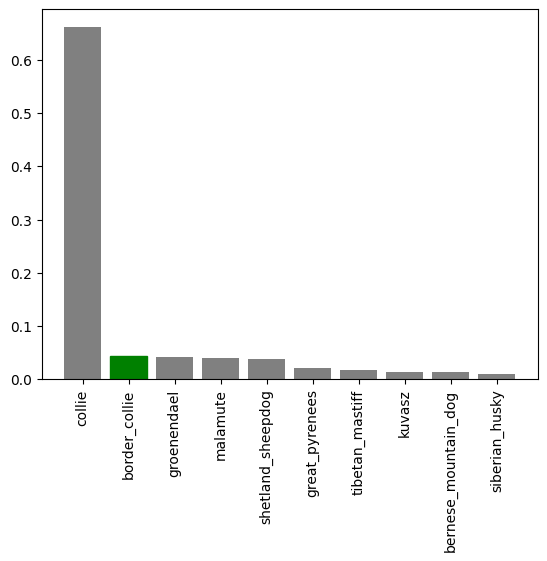

In [ ]:
plot_pred_conf(predictions,val_labelss,n=9)

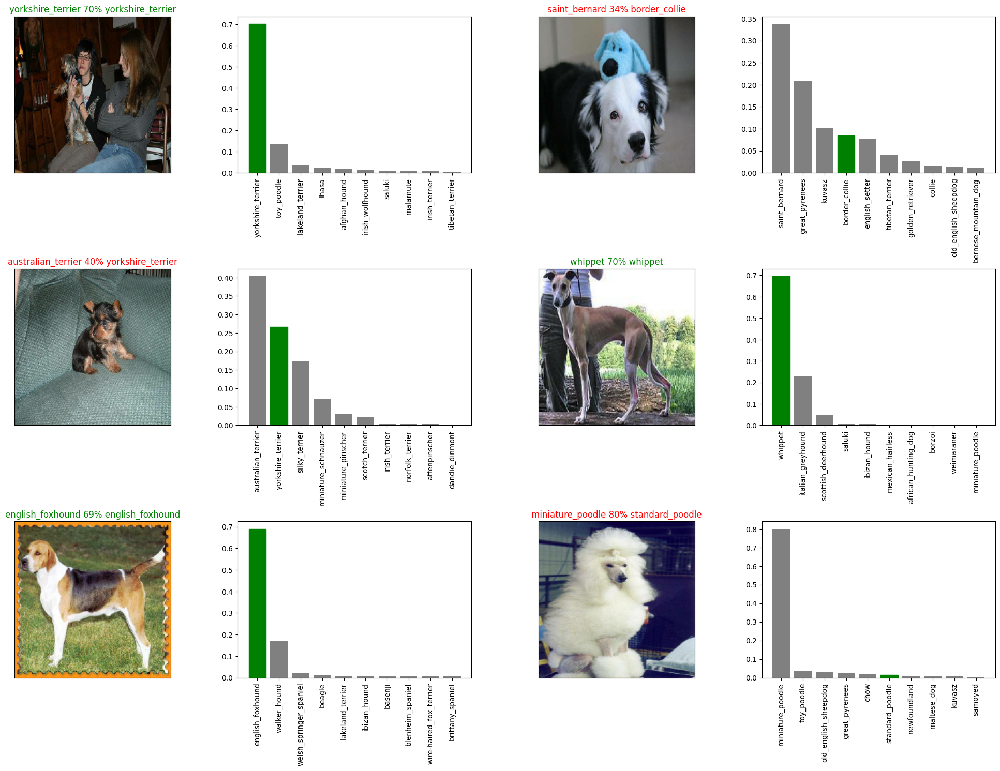

In [ ]:
# Now lets checkout few predictions and their diff values
i_multiplier = 10
num_rows =3
num_cols = 2
num_img = num_rows*num_cols
plt.figure(figsize=(10*num_cols , 5*num_rows))

for i in range(num_img):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(predictions,val_labelss,val_images,i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(predictions,val_labelss,i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()



## Saving and Loading model

In [ ]:
# Create a function
def save_model(model , suffix = None):
  """
  Saves Model in Models directory and appends a suffix
  """
  modeldir = os.path.join("/content/drive/MyDrive/Dog-Vision-Project/Models",datetime.datetime.now().strftime("%Y%m%d - %H%M%s"))
  modelpath = modeldir + "-"+suffix+".h5" #Save format
  print(f"Saving Model to {modelpath}")
  model.save(modelpath)
  return modelpath

In [ ]:
# Create a function to load a model
def load_model(modelpath):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from:{modelpath}")
  model = keras.models.load_model(modelpath,
                                  custom_objects= {"KerasLayer":hub.KerasLayer})
  return model


In [ ]:
#Save our model trained on 1000 images
save_model(model , suffix="1000-images-mobilenetv2-Adam")



Saving Model to /content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 16081742400495-1000-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 16081742400495-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
load_1000_images = load_model("/content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 14241742394262-1000-images-mobilenetv2-Adam.h5")

Loading saved model from:/content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 14241742394262-1000-images-mobilenetv2-Adam.h5


In [ ]:
#evaulate
load_1000_images.evaluate(valid_data)

7/7 [==============================] - 3s 113ms/step - loss: 1.1675 - accuracy: 0.6700


[1.1675312519073486, 0.6700000166893005]

## Training on All data


In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
full_data = create_data_batches(X, y)
full_model = create_model()
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience=3)
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Creating Batches for Training Data
Epoch 1/100
320/320 [==============================] - 53s 147ms/step - loss: 1.3362 - accuracy: 0.6690
Epoch 2/100
320/320 [==============================] - 44s 139ms/step - loss: 0.3971 - accuracy: 0.8844
Epoch 3/100
320/320 [==============================] - 44s 137ms/step - loss: 0.2335 - accuracy: 0.9370
Epoch 4/100
320/320 [==============================] - 44s 138ms/step - loss: 0.1542 - accuracy: 0.9637
Epoch 5/100
320/320 [==============================] - 44s 136ms/step - loss: 0.1074 - accuracy: 0.9787
Epoch 6/100
320/320 [==============================] - 46s 144ms/step - loss: 0.0761 - accuracy: 0.9879
Epoch 7/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0578 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 42s 132ms/step - loss: 0.0463 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0369 - accuracy: 0.9968
Epoch 10/100
320/320 [=======

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2")

Saving Model to /content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 16431742402599-full-image-set-mobilenetv2.h5


/usr/local/lib/python3.11/dist-packages/tf_keras/src/engine/training.py:3098: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native TF-Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 16431742402599-full-image-set-mobilenetv2.h5'

In [ ]:
loaded_full_model = load_model("/content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 16431742402599-full-image-set-mobilenetv2.h5")

Loading saved model from:/content/drive/MyDrive/Dog-Vision-Project/Models/20250319 - 16431742402599-full-image-set-mobilenetv2.h5


## Making Predictions on test dataset

In [ ]:
test_path = "/content/drive/MyDrive/Dog-Vision-Project/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]


In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating Batches for Test Data


In [ ]:
test_predictions = loaded_full_model.predict(test_data,verbose = 1)

324/324 [==============================] - 1000s 3s/step


In [ ]:
#Save to csv file
np.savetxt("/content/drive/MyDrive/Dog-Vision-Project/test_predictions.csv",test_predictions,delimiter=",")

In [ ]:
test_predictions = np.loadtxt("/content/drive/MyDrive/Dog-Vision-Project/test_predictions.csv",delimiter=",")

In [ ]:
test_predictions[:10]

array([[1.84314120e-09, 6.25042683e-12, 6.05272277e-10, ...,
        1.11990876e-03, 7.48578075e-11, 7.01353689e-12],
       [3.53071613e-07, 1.99266403e-09, 3.75491083e-10, ...,
        3.50847387e-08, 1.86545049e-06, 1.59774757e-07],
       [1.22048819e-15, 2.41863387e-12, 1.21782440e-13, ...,
        5.95431690e-11, 5.87179372e-08, 9.01424421e-12],
       ...,
       [1.58682149e-13, 2.48636294e-15, 5.14391547e-15, ...,
        4.69518781e-12, 5.09572717e-14, 1.92850770e-12],
       [2.71283495e-12, 5.41582779e-09, 1.75432047e-11, ...,
        1.13083319e-11, 1.53227680e-12, 1.95627348e-10],
       [1.49167398e-14, 1.10141514e-11, 4.54771465e-09, ...,
        3.45074623e-05, 3.47420833e-12, 4.86853446e-10]])

In [ ]:
test_predictions.shape

(10357, 120)

### Preparing test for submission

In [ ]:
#Create Pandas dataframe
preds_df = pd.DataFrame(columns = ["id"] + list(unique_breeds))
preds_df.head()


,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_id = [os.path.basename(filename).split(".")[0] for filename in test_filenames]
test_id[:10]

['de3fbd6fb5444fcf14390ac90545c2f1',
 'e68da487dabcd11874830a177e8b6218',
 'e46a2bfb7816324d171c4e07786abc59',
 'e726ac27864ecbde1f5822c4d6e26c17',
 'e5c0666aa15120eba4718ae947a52c45',
 'e29f03a924c493b29d17877204dd0205',
 'e145bbebb9ad1e740256e460899a6b67',
 'df86ba50c4d0b597af0d23bda37eb10e',
 'e2b6d4957b62934bd831c3a1b65e2ebb',
 'e5fc0207e1db00fa778b00832f622b10']

In [ ]:
preds_df["id"] = test_id

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de3fbd6fb5444fcf14390ac90545c2f1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e68da487dabcd11874830a177e8b6218,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e46a2bfb7816324d171c4e07786abc59,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e726ac27864ecbde1f5822c4d6e26c17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e5c0666aa15120eba4718ae947a52c45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,de3fbd6fb5444fcf14390ac90545c2f1,1.843141e-09,6.250427e-12,6.052723e-10,8.569302e-12,9.353253e-06,4.124316e-10,1.495208e-10,7.300201e-07,5.266094e-10,...,2.937947e-09,7.389167e-06,2.048365e-08,2.920125e-10,1.054546e-12,1.052960e-13,2.506806e-11,1.119909e-03,7.485781e-11,7.013537e-12
1,e68da487dabcd11874830a177e8b6218,3.530716e-07,1.992664e-09,3.754911e-10,4.545874e-08,3.840126e-09,2.199907e-07,5.662678e-12,1.017966e-11,2.943584e-10,...,1.667139e-07,1.189460e-10,7.032000e-11,4.294447e-10,5.154632e-11,3.222877e-10,2.240891e-09,3.508474e-08,1.865450e-06,1.597748e-07
2,e46a2bfb7816324d171c4e07786abc59,1.220488e-15,2.418634e-12,1.217824e-13,1.282445e-10,1.624564e-13,4.716940e-12,1.115205e-13,2.876811e-11,3.308542e-12,...,3.283994e-07,4.437494e-10,8.148668e-11,3.779301e-13,8.289923e-09,3.114880e-14,4.234228e-11,5.954317e-11,5.871794e-08,9.014244e-12
3,e726ac27864ecbde1f5822c4d6e26c17,3.465642e-11,1.559330e-06,3.674118e-09,3.312715e-05,4.769966e-06,7.426015e-07,1.008492e-10,1.112132e-09,2.200588e-09,...,1.550340e-09,1.628280e-12,4.002669e-06,6.309925e-07,2.287504e-05,1.052712e-10,7.507397e-11,2.163499e-04,5.802733e-09,1.089701e-08
4,e5c0666aa15120eba4718ae947a52c45,1.745221e-13,4.739211e-05,1.014436e-11,3.675396e-13,2.293618e-12,4.421659e-10,2.342597e-08,3.250172e-12,8.115240e-11,...,5.124252e-12,3.752193e-13,2.970250e-13,1.299030e-10,6.508223e-09,2.956973e-09,1.452120e-13,1.228229e-08,4.909735e-12,2.505183e-10


In [ ]:
preds_df.to_csv("/content/drive/MyDrive/Dog-Vision-Project/submission.csv",index=False)

In [2]:
from google.colab import files
files.download("/content/drive/MyDrive/Dog-Vision-Project")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>